# Test

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
from learn import *
sys.path.insert(0, 'code')
from v17 import *
from v17 import _internal_validate_predict_best_param
from v17 import evalfscore

In [26]:
sz = 256
num_slice = 25

num_gpus = 4
gpu_start = 4
num_workers = 0
device_ids = range(gpu_start, gpu_start + num_gpus)
# device_ids = [0,1,4,5]
torch.cuda.set_device(gpu_start)
bs = 8

model_name = 'deeplab'
datapaths = ['data/train/AOI_2_Vegas_Train', 'data/train/AOI_3_Paris_Train', 'data/train/AOI_4_Shanghai_Train', 'data/train/AOI_5_Khartoum_Train']
datapath = datapaths[1]

## Preprocessing

In [4]:
# !python code/v5_im-full_rgb.py preproc_test {datapaths[0]}

In [5]:
# !python code/v5_im-full_rgb.py preproc_test {datapaths[3]}

In [6]:
# !python code/v5_im-full_rgb.py preproc_test {datapaths[1]}
# !python code/v5_im-full_rgb.py preproc_test {datapaths[2]}

## Scripting

With rescaling

In [3]:
%%time
%run script 1 --num_gpus=2 --gpu_start=0 --bs=8 --pred --rescale --eval --num_slice 25 --debug


Data finished loading: data/train/AOI_3_Paris_Train
Data finished loading: data/train/AOI_3_Paris_Train
0.0 0
0.05 0.003053
0.1 0.009138
0.15000000000000002 0.006978
0.2 0.006107
0.25 0.002188
0.30000000000000004 0.000438
0.35000000000000003 0
0.4 0
0.45 0
0.5 0
0.55 0
0.6000000000000001 0
0.65 0
0.7000000000000001 0
0.75 0
0.8 0
0.8500000000000001 0
0.9 0
0.9500000000000001 0
1.0 0
CPU times: user 10min 18s, sys: 1min 5s, total: 11min 23s
Wall time: 2min 26s


In [1]:
%%time
%run script 1 --num_gpus=2 --gpu_start=0 --bs=40 --pred --rescale --eval --num_slice 81


Data finished loading: data/train/AOI_3_Paris_Train



Data finished loading: data/train/AOI_3_Paris_Train



0.0 0
0.05 0.090601
0.1 0.248519
0.15000000000000002 0.350735
0.2 0.436494
0.25 0.490536
0.30000000000000004 0.514571
0.35000000000000003 0.50863
0.4 0.486882
0.45 0.439223
0.5 0.36896
0.55 0.286687
0.6000000000000001 0.205833
0.65 0.124184
0.7000000000000001 0.059847
0.75 0.021131
0.8 0.00533
0.8500000000000001 0.001579
0.9 0
0.9500000000000001 0
1.0 0
CPU times: user 5h 52min 23s, sys: 30min 16s, total: 6h 22min 40s
Wall time: 39min 13s


In [9]:
print(prs, np.argmax(fscores))
print(prs[np.argmax(fscores)])

([], (0.137115, 0.067651), (0.331496, 0.198766), (0.452174, 0.28647), (0.550486, 0.361613), (0.607818, 0.411194), (0.636364, 0.431908), (0.625402, 0.428603), (0.597182, 0.410974), (0.543182, 0.368665), (0.465882, 0.305421), (0.375, 0.232041), (0.282961, 0.161745), (0.181741, 0.094315), (0.097416, 0.043191), (0.040273, 0.014323), (0.013749, 0.003305), (0.007561, 0.000881), [], [], []) 6
(0.636364, 0.431908)


In [ ]:
%%time
%run script 1 --num_gpus=2 --gpu_start=0 --bs=40 --pred --rescale --eval --num_slice 25


Data finished loading: data/train/AOI_3_Paris_Train



Data finished loading: data/train/AOI_3_Paris_Train



0.0 0
0.05 0.090601
0.1 0.248519
0.15000000000000002 0.350735
0.2 0.436494
0.25 0.490536
0.30000000000000004 0.514571
0.35000000000000003 0.50863
0.4 0.486882
0.45 0.439223
0.5 0.36896
0.55 0.286687
0.6000000000000001 0.205833


## Without rescaling, 25 patches

In [5]:
%%time
%run script 1 --num_gpus=2 --gpu_start=0 --bs=40 --pred --eval --num_slice 25


Data finished loading: data/train/AOI_3_Paris_Train



345


TypeError: 'NoneType' object is not subscriptable

CPU times: user 2h 5min 58s, sys: 11min 36s, total: 2h 17min 34s
Wall time: 6min 2s


In [6]:
fscores, prs = evalfscore(datapath, [preds_1], [], debug=args.debug, num_slice=num_slice)

345


0.2 0.541849
0.2571428571428572 0.581936
0.3142857142857143 0.606563
0.37142857142857144 0.607632
0.4285714285714286 0.600222
0.5428571428571429 0.535267
0.6 0.464636



In [7]:
prs

((0.624317, 0.478625),
 (0.667046, 0.516086),
 (0.692395, 0.539665),
 (0.691205, 0.542089),
 (0.682776, 0.535478),
 (0.658585, 0.514764),
 (0.611788, 0.47576),
 (0.532934, 0.411855))

Without rescaling, 81 patches

In [18]:
%%time
%run script 1 --num_gpus=2 --gpu_start=0 --bs=40 --pred --eval --num_slice 81


Data finished loading: data/train/AOI_3_Paris_Train



345


0.2 0.546604
0.2571428571428572 0.586563
0.3142857142857143 0.610237
0.37142857142857144 0.615021
0.4285714285714286 0.608847
0.4857142857142857 0.58781
0.5428571428571429 0.543932
0.6 0.480161

CPU times: user 6h 53min 20s, sys: 35min 18s, total: 7h 28min 39s
Wall time: 27min 35s


<Figure size 432x288 with 0 Axes>

In [19]:
prs

((0.641437, 0.476201),
 (0.683578, 0.513662),
 (0.703917, 0.538563),
 (0.705765, 0.544954),
 (0.698006, 0.539885),
 (0.676614, 0.519612),
 (0.628357, 0.479506),
 (0.558085, 0.421331))

### Eyeballing test result

In [16]:
learn.data.val_ds.num_slice = 25

In [19]:
%%time
learn.data.val_ds.rescale = False
with ThreadPoolExecutor(max_workers=1) as e:
    x, y = list(zip(*list(e.map(learn.data.val_dl.get_batch, [[o] for o in range(learn.data.val_ds.get_n())]))))
x, y, preds_1 = [np.squeeze(o) for o in (x, y, preds_1)]
print(x.shape)

KeyboardInterrupt: 

In [9]:
(trn_x,trn_y), (val_x,val_y) = data

In [15]:
num_slice = 25
# avg = _internal_validate_predict_best_param(3, slice_pred_list=[preds_1], rescale_pred_list=[preds_rescale],
#                                             num_slice=num_slice)
slice_only = _internal_validate_predict_best_param(3, slice_pred_list=[preds_1], num_slice=num_slice)
# rescale_only = _internal_validate_predict_best_param(3, rescale_pred_list=[preds_rescale], num_slice=num_slice)
x_big = val_x
y_big = val_y
# avg.shape

345


NameError: name 'avg' is not defined

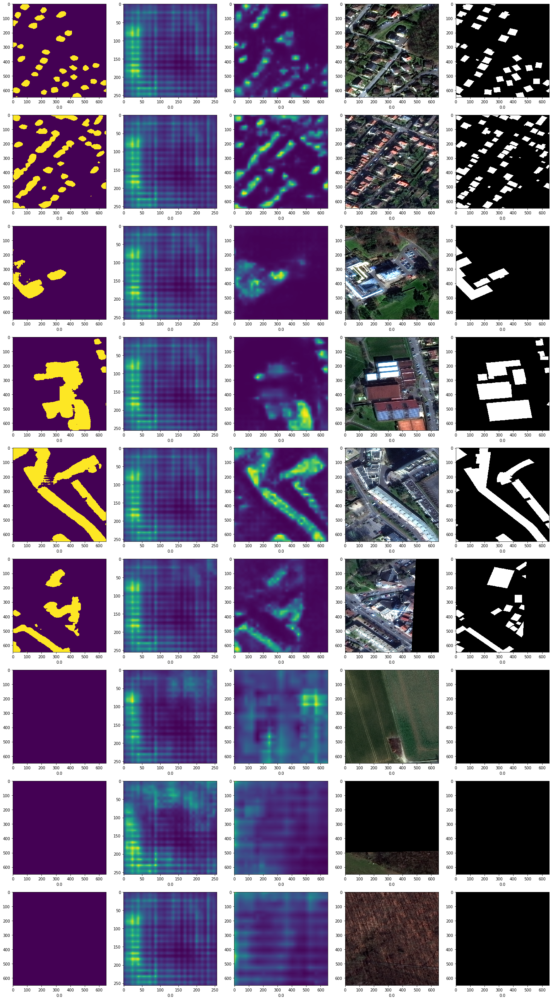

In [30]:
idx = 109
num_ims = 9
data_im = zip(avg[idx:idx + num_ims]>0.3, preds_1[idx:idx + num_ims], rescale_only[idx:idx + num_ims],
              val_x[idx:idx + num_ims], val_y[idx:idx + num_ims])
# data_im = [avg[idx:idx + 9]]
plot_ims(data_im, figsize=4)

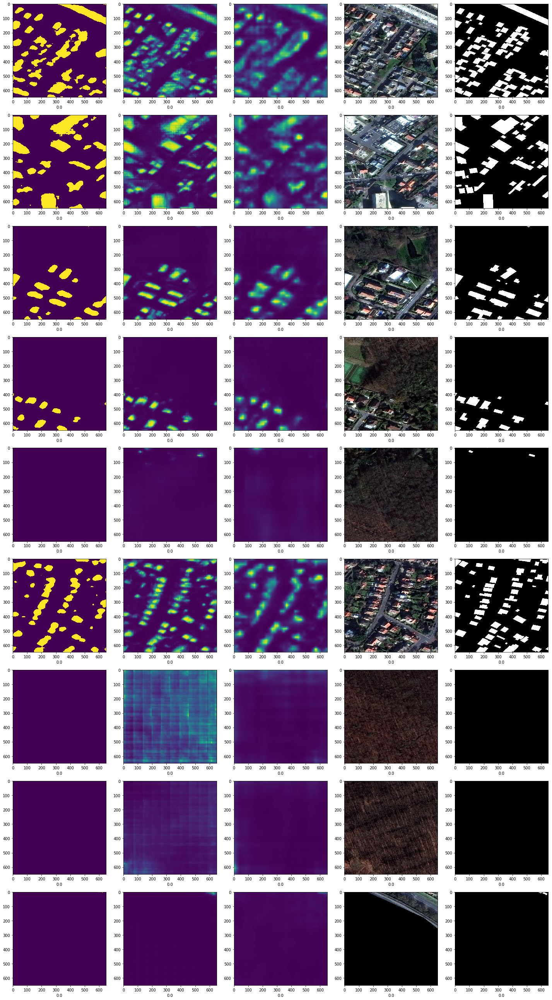

In [52]:
idx = 119
num_ims = 9
data_im = zip(avg[idx:idx + num_ims]>0.3, slice_only[idx:idx + num_ims], rescale_only[idx:idx + num_ims],
              val_x[idx:idx + num_ims], val_y[idx:idx + num_ims])
# data_im = [avg[idx:idx + 9]]
plot_ims(data_im, figsize=4)

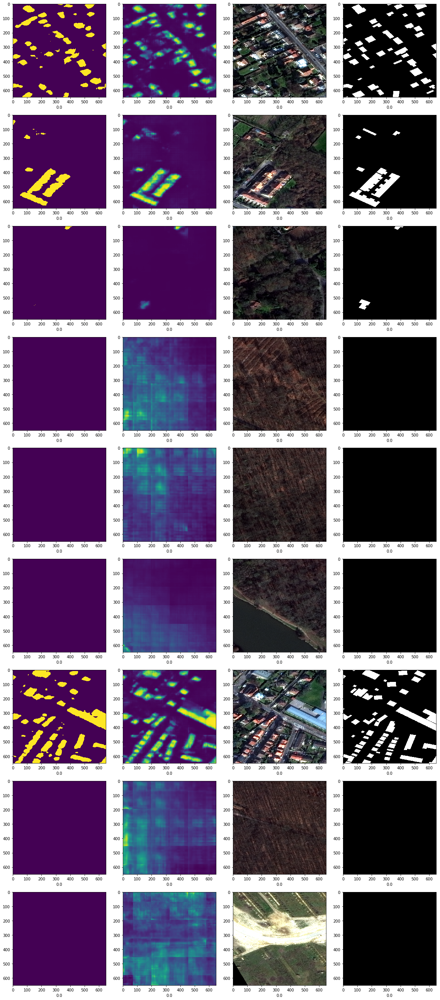

In [16]:
idx = 130
num_ims = 9
data_im = zip(slice_only[idx:idx + num_ims]>0.37, slice_only[idx:idx + num_ims],
              val_x[idx:idx + num_ims], val_y[idx:idx + num_ims])
# data_im = [avg[idx:idx + 9]]
plot_ims(data_im, figsize=4)

Plot reflection

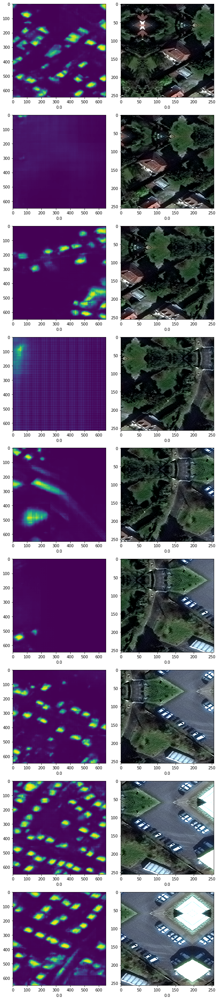

In [51]:
idx = 18
num_ims = 9
x = [learn.data.val_ds.get_x(i) for i in range(idx * 81, idx * 81 + 81)]
data_im = zip(slice_only[idx:idx + num_ims], x[:num_ims])
# data_im = [avg[idx:idx + 9]]
plot_ims(data_im, figsize=4)

Without reflextion

In [67]:
preds_big = _internal_validate_predict_best_param(3, slice_pred_list=[preds_1], rescale_pred_list=[])
x_big = _internal_validate_predict_best_param(3, slice_pred_list=[denorm(x)[...,0]])
y_big = _internal_validate_predict_best_param(3, slice_pred_list=[y])

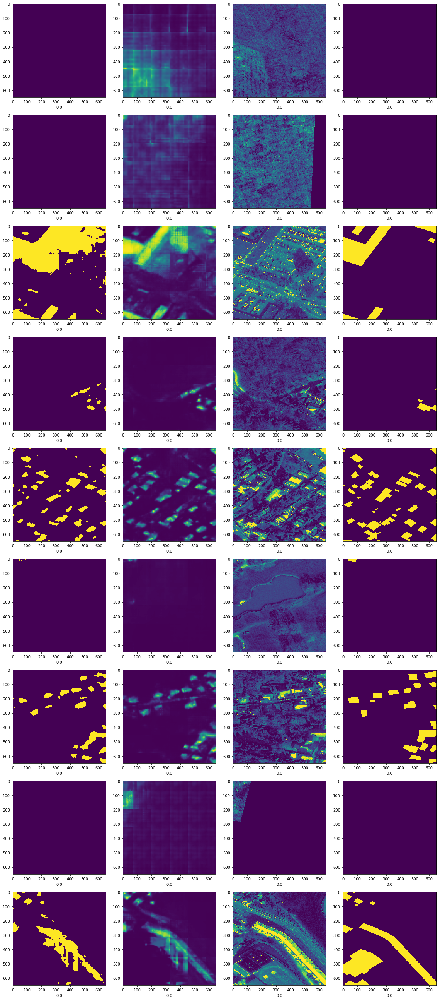

In [68]:
idx = 14
num_ims = 9
data_im = zip(preds_big[idx:idx + num_ims] > 0.2, preds_big[idx:idx + num_ims], 
              x_big[idx:idx + num_ims], y_big[idx:idx + num_ims])
plot_ims(data_im, figsize=4)

In [69]:
preds_big = _internal_validate_predict_best_param(3, slice_pred_list=[], rescale_pred_list=[preds_rescale])
x_big = _internal_validate_predict_best_param(3, slice_pred_list=[denorm(x)[...,0]])
y_big = _internal_validate_predict_best_param(3, slice_pred_list=[y])

code/v17.py:320: RuntimeWarning: divide by zero encountered in true_divide
  pred_values = pred_values / pred_count
code/v17.py:320: RuntimeWarning: invalid value encountered in true_divide
  pred_values = pred_values / pred_count


/home/twofyw/miniconda3/envs/fastai/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in greater
  This is separate from the ipykernel package so we can avoid doing imports until


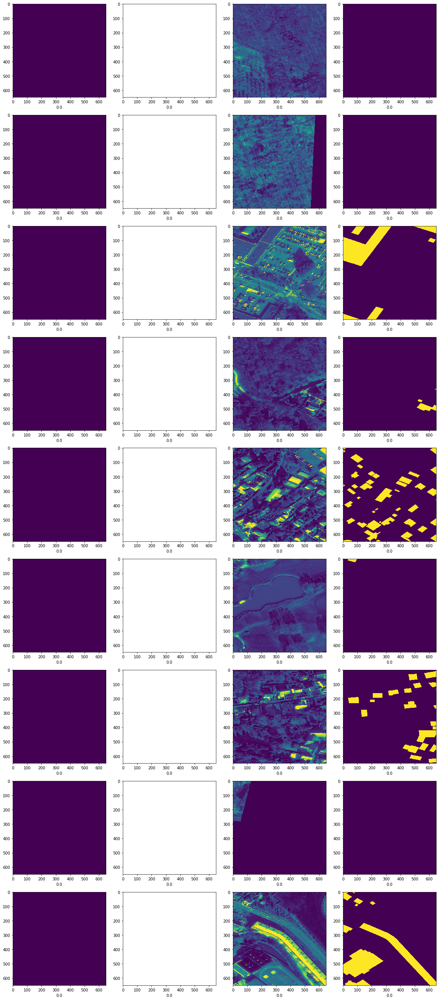

In [70]:
idx = 14
num_ims = 9
data_im = zip(preds_big[idx:idx + num_ims] > 0.2, preds_big[idx:idx + num_ims], 
              x_big[idx:idx + num_ims], y_big[idx:idx + num_ims])
plot_ims(data_im, figsize=4)

In [ ]:
scores = None

In [ ]:
scores = plot_worse_preds(x_big, y_big, preds_big, fscore, scores=scores, shift=100)

## Pixel level best threshold

In [46]:
fscore(avg, y_big, thresh=0.25)

0.7759074510092517

In [ ]:
# wrong pytorch implementation
%%time
threshs = np.linspace(0, 1, 3)
t_preds_big, t_y_big = T(preds_big).float(), T(y_big).float()
with ThreadPoolExecutor(max_workers=8) as e:
    gen = e.map(partial(pr, t_preds_big, t_y_big), threshs)

In [ ]:
%%time
threshs = np.linspace(0, 1, 20)
score = [pr_np(preds_big, y_big, thresh) for thresh in threshs]

In [ ]:
res = [(o[0][0], o[1][0]) for o in gen]

In [ ]:
plt.plot(*zip(*score))

In [ ]:
distance = [o[0] - o[1] for o in score]

In [ ]:
np.argmin(np.abs(distance)) / 20 

## Polygon best threshold

In [4]:
def evalfscore_thresh(thresh):
    return evalfscore(datapath, preds, thresh=thresh)

In [7]:
%%time
threshs = np.linspace(0, 1, 21)
polygon_pr = []
for thresh in threshs:
#     with ThreadPoolExecutor(max_workers=8) as e:
    s = evalfscore_thresh(thresh)
    print(s)
    polygon_pr.append(s)
# plt.plot(polygon_pr)

(0, 0)
(0.273282, 0.157779)
(0.510218, 0.319083)
(0.616744, 0.407448)
(0.676692, 0.456148)
(0.717342, 0.48766)
(0.741094, 0.513442)
(0.75319, 0.533275)
(0.744271, 0.5368)
(0.736288, 0.523579)
(0.70298, 0.499119)
(0.662707, 0.467166)
(0.600315, 0.419348)
(0.517955, 0.352799)
(0.405441, 0.269282)
(0.277308, 0.173424)
(0.15084, 0.085059)
(0.04962, 0.02446)
(0.013034, 0.003967)
(0.017921, 0.001102)
(0, 0)
CPU times: user 1h 2min 47s, sys: 4min 42s, total: 1h 7min 30s
Wall time: 37min 45s


In [14]:
epsilon = 1e-12
fscore = [2 * o[0] * o[1] / (o[0] + o[1] + epsilon) for o in polygon_pr]

0.35 0.6244357945994453


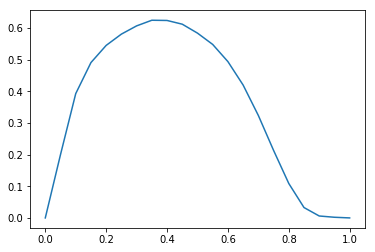

In [20]:
plt.plot(threshs, fscore)
plt.xlabel = 'threshold'
plt.ylabel = 'fscore'
print(np.argmax(fscore) / 20, fscore[np.argmax(fscore)])

In [67]:
# %%time
# threshs = np.linspace(0, 1, 20)
# polygon_pr = []
# for thresh in threshs:
#     polygon_pr.append(evalfscore(datapath, preds, thresh))
# plt.plot(polygon_pr)

0.0 (0, 0)
0.05263157894736842 (0.281055, 0.169017)


KeyboardInterrupt: 

CPU times: user 1h 9min 29s, sys: 5min 39s, total: 1h 15min 9s
Wall time: 44min 24s


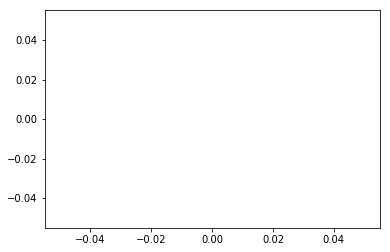

In [72]:
# %%time
# threshs = np.linspace(0, 1, 21)
# for thresh in threshs:
#     with ThreadPoolExecutor(max_workers=8) as e:
#         polygon_pr = list(e.map(evalfscore_thresh(thresh)))
# plt.plot(polygon_pr)

In [74]:
polygon_pr

[]

## Guided Filter

In [24]:
sns.set(style="white")
srcs = (preds_big * 255).astype('uint8')
guides = (x_big * 255).astype('uint8')
gts = (y_big * 255).astype('uint8')

In [25]:
idx = 16
plt.imshow(cv2.ximgproc.guidedFilter(guides[16], srcs[16], radius=radius[3], eps=eps[3]))

NameError: name 'radius' is not defined

In [ ]:
%%time
rows, cols = 5, 10
radius = np.arange(1, 6, 1).astype('uint8')
eps = np.linspace(10, 50, 40 / cols + 1).astype('uint8')
res = np.empty([rows, cols] + list(srcs.shape))
for row, r in enumerate(radius):
    for col, e in enumerate(eps):    
#         for i, src in enumerate(srcs):
        with ThreadPoolExecutor(max_workers=8) as e:
            res_batch = list(e.map((partial(cv2.ximgproc.guidedFilter, radius=r, eps=e), guides, srcs)))
            for i, res_im in enumerate(res_batch):
                res[row, col, i] = res_im

In [ ]:
%%time
score_mat = np.empty([rows, cols])
for row, r in enumerate(radius):
    with ThreadPoolExecutor(max_workers=8) as e:
        res_cols = list(e.map(fscore, res[row] > int(255), np.broadcast_to(gts, [cols] + list(gts.shape))))
        for i, res_col in enumerate(res_cols):
            score_mat[row, i] = res_col

In [ ]:
sns.set(style="white")
cmap = sns.diverging_palette(220, 10, as_cmap=True)
ax = sns.heatmap(score_mat, cmap=cmap,
            square=True, linewidths=.5, cbar_kws={"shrink": 1})
# ax.xaxis.set_ticks(eps)
print(score_mat.argmax())

# Submission

In [3]:
%%time
%run script 1 --num_gpus=2 --gpu_start=0 --bs=20 --test --num_slice 81

MemoryError: 

CPU times: user 38.7 s, sys: 16.2 s, total: 54.9 s
Wall time: 35 s
